In [1]:
import numpy as np
import pandas as pd

In [2]:
import warnings
warnings.filterwarnings('ignore')

# settings to see the data.
pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.options.display.max_colwidth = 500

In [3]:
df = pd.read_csv("creditcard.csv")
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [4]:
from sklearn.preprocessing import PowerTransformer

In [5]:
scaler = PowerTransformer(method='yeo-johnson')
df[['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount']] = scaler.fit_transform(df[['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount']])

In [6]:
df_fraud = df[df.Class.eq(1)]

In [7]:
df_norm = df[df.Class.eq(0)]

In [8]:
df_val_norm = df_norm.head(200)

In [9]:
df_val_fraud = df_fraud.tail(200)

In [10]:
df_val = df_val_norm.append(df_val_fraud, ignore_index=True)

In [11]:
X_val = df_val[['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount']]

In [12]:
y_val = df_val[['Class']]

In [13]:
df_train_norm = df_norm.iloc[200:]

In [14]:
df_train_fraud = df_fraud.iloc[:-200]

In [15]:
df_train = df_train_norm.append(df_train_fraud, ignore_index=True)

In [16]:
import imblearn
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import ADASYN
from matplotlib import pyplot
from numpy import where

Using TensorFlow backend.


In [17]:
X = df_train[['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount']]

In [18]:
col_x = X.columns
col_x

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount'],
      dtype='object')

In [19]:
y = df_train[['Class']]

In [20]:
col_y = y.columns
col_y

Index(['Class'], dtype='object')

In [21]:
# transform the dataset
oversample = ADASYN()

In [22]:
# transform the dataset
X, y = oversample.fit_resample(X, y)
y =pd.Series(y)

In [23]:
X = pd.DataFrame(X)
y = pd.DataFrame(y)

In [24]:
X.columns = col_x
y.columns = col_y

In [25]:
from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7,test_size=0.3,random_state=100) 

In [26]:
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [27]:
# Logistic regression model, first training model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Class   No. Observations:               397799
Model:                            GLM   Df Residuals:                   397769
Model Family:                Binomial   Df Model:                           29
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 21 Jun 2020   Deviance:                          inf
Time:                        19:16:01   Pearson chi2:                 4.50e+15
No. Iterations:                     2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.9952      0.006   -337.936      0.000      -2.007      -1.984
V1            -0.5327      0.006    -84.707      0.000      -0.545      -0.520
V2            -0.1089      0.006    -18.402      0.000      -0.121      -0.097
V3             0.2010      0.006     36.072      0.000       0.190       0.212
V4             0.9885      0.005    202.268      0.000       0.979       0.998
V5            -0.4422      0.006    -75.566      0.000      -0.454      -0.431
V6            -0.0252      0.006     -4.342      0.000      -0.037      -0.014
V7             0.1502      0.005     31.879      0.000       0.141       0.159
V8            -0.2157      0.003    -66.011      0.000      -0.222      -0.209
V9            -0.0190      0.005     -3.791      0.000      -0.029      -0.009
V10           -0.1024      0.005    -22.174      0.000      -0.111      -0.093
V11            0.2686      0.004     60.627      0.000       0.260       0.277
V12           -0.3131      0.005    -67.044      0.000      -0.322      -0.304
V13           -0.3048      0.004    -68.602      0.000      -0.314      -0.296
V14           -0.5915      0.004   -138.445      0.000      -0.600      -0.583
V15            0.3375      0.004     78.334      0.000       0.329       0.346
V16            0.0290      0.005      6.251      0.000       0.020       0.038
V17            0.1499      0.003     48.857      0.000       0.144       0.156
V18            0.2101      0.005     43.062      0.000       0.200       0.220
V19           -0.1064      0.004    -25.555      0.000      -0.115      -0.098
V20           -0.1749      0.005    -34.812      0.000      -0.185      -0.165
V21           -0.0084      0.004     -2.020      0.043      -0.017      -0.000
V22            0.1138      0.005     22.034      0.000       0.104       0.124
V23            0.1145      0.005     23.354      0.000       0.105       0.124
V24           -0.2561      0.005    -47.659      0.000      -0.267      -0.246
V25            0.5837      0.005    116.614      0.000       0.574       0.593
V26           -0.3516      0.005    -68.339      0.000      -0.362      -0.342
V27           -0.0615      0.004    -13.885      0.000      -0.070      -0.053
V28           -0.0009      0.006     -0.150      0.881      -0.012       0.010
Amount        -0.1495      0.006    -26.404      0.000      -0.161      -0.138
==============================================================================
"""

In [28]:
logreg = LogisticRegression()

In [29]:
rfe = RFE(logreg, 15)
rfe = rfe.fit(X_train, y_train)

In [30]:
rfe.support_

array([False, False,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True, False,  True, False,  True,  True, False,
       False, False, False, False, False,  True,  True,  True, False,
       False, False])

In [31]:
list(zip(col_x, rfe.support_, rfe.ranking_))

[('V1', False, 13),
 ('V2', False, 7),
 ('V3', True, 1),
 ('V4', True, 1),
 ('V5', True, 1),
 ('V6', True, 1),
 ('V7', False, 9),
 ('V8', True, 1),
 ('V9', True, 1),
 ('V10', True, 1),
 ('V11', True, 1),
 ('V12', True, 1),
 ('V13', False, 5),
 ('V14', True, 1),
 ('V15', False, 6),
 ('V16', True, 1),
 ('V17', True, 1),
 ('V18', False, 12),
 ('V19', False, 15),
 ('V20', False, 4),
 ('V21', False, 14),
 ('V22', False, 10),
 ('V23', False, 3),
 ('V24', True, 1),
 ('V25', True, 1),
 ('V26', True, 1),
 ('V27', False, 11),
 ('V28', False, 2),
 ('Amount', False, 8)]

In [32]:
col = col_x[rfe.support_]
col

Index(['V3', 'V4', 'V5', 'V6', 'V8', 'V9', 'V10', 'V11', 'V12', 'V14', 'V16',
       'V17', 'V24', 'V25', 'V26'],
      dtype='object')

In [33]:
col_x[~rfe.support_]

Index(['V1', 'V2', 'V7', 'V13', 'V15', 'V18', 'V19', 'V20', 'V21', 'V22',
       'V23', 'V27', 'V28', 'Amount'],
      dtype='object')

In [34]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Class   No. Observations:               397799
Model:                            GLM   Df Residuals:                   397783
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 21 Jun 2020   Deviance:                          inf
Time:                        19:16:25   Pearson chi2:                 4.50e+15
No. Iterations:                     4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.5882      0.009   -280.749      0.000      -2.606      -2.570
V3             0.6504      0.007     98.746      0.000       0.638       0.663
V4             1.4113      0.007    211.840      0.000       1.398       1.424
V5            -0.6375      0.008    -76.486      0.000      -0.654      -0.621
V6            -0.4364      0.010    -45.486      0.000      -0.455      -0.418
V8            -0.6103      0.004   -143.444      0.000      -0.619      -0.602
V9            -0.3528      0.006    -56.820      0.000      -0.365      -0.341
V10           -0.6253      0.006    -97.829      0.000      -0.638      -0.613
V11            0.4976      0.005     94.670      0.000       0.487       0.508
V12           -0.6161      0.006   -109.149      0.000      -0.627      -0.605
V14           -0.9493      0.006   -170.656      0.000      -0.960      -0.938
V16           -0.0810      0.005    -15.553      0.000      -0.091      -0.071
V17            0.2688      0.004     62.230      0.000       0.260       0.277
V24           -0.5529      0.008    -69.451      0.000      -0.569      -0.537
V25            0.6313      0.006     98.988      0.000       0.619       0.644
V26           -0.4924      0.006    -78.986      0.000      -0.505      -0.480
==============================================================================
"""

### Adding the probablity column

Now we add the probablity column as well as the prediction column in order to make our predictions.

In [35]:
# Get the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

239371    0.027634
267770    0.002781
498983    0.780202
306770    0.998573
227598    0.041282
65574     0.981234
330477    0.936794
498844    0.790400
229267    0.895200
99858     0.091606
dtype: float64

In [36]:
y_train_pred_final = pd.DataFrame({'Fraud':y_train.values.ravel(), 'Fraud_Prob':y_train_pred})

In [37]:
y_train_pred_final.head()

,Fraud,Fraud_Prob
239371,0,0.027634
267770,0,0.002781
498983,1,0.780202
306770,1,0.998573
227598,0,0.041282


In [38]:
y_train_pred_final['predicted'] = y_train_pred_final.Fraud_Prob.map(lambda x: 1 if x > 0.035 else 0)

y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted
239371,0,0.027634,0
267770,0,0.002781,0
498983,1,0.780202,1
306770,1,0.998573,1
227598,0,0.041282,1


# Confusion Matrix

In [39]:
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
import sklearn.metrics as metrics

In [40]:
confusion = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final.predicted )
print(confusion)

[[ 67586 131448]
 [     0 198765]]


In [42]:
#overall accuracy check
print(metrics.accuracy_score(y_train_pred_final.Fraud, y_train_pred_final.predicted))

0.6695617636042323


In [43]:
# VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,V10,8.34
9,V14,6.64
11,V17,5.62
4,V8,5.22
10,V16,5.22
2,V5,4.64
0,V3,3.87
8,V12,3.79
7,V11,3.77
1,V4,2.60


### Removal of variables and updation of the Model

Some of the variable have high VIFs although the p-value of them are in a good state. Those variables are insignificant and can be dropped.

In [44]:
col = col.drop('V10', 1)
col

Index(['V3', 'V4', 'V5', 'V6', 'V8', 'V9', 'V11', 'V12', 'V14', 'V16', 'V17',
       'V24', 'V25', 'V26'],
      dtype='object')

In [46]:
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Class   No. Observations:               397799
Model:                            GLM   Df Residuals:                   397784
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 21 Jun 2020   Deviance:                          inf
Time:                        19:20:11   Pearson chi2:                 4.50e+15
No. Iterations:                     4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.5934      0.009   -275.640      0.000      -2.612      -2.575
V3             0.6307      0.007     94.422      0.000       0.618       0.644
V4             1.4020      0.007    211.464      0.000       1.389       1.415
V5            -0.7328      0.008    -86.405      0.000      -0.749      -0.716
V6            -0.5852      0.010    -59.576      0.000      -0.604      -0.566
V8            -0.5468      0.004   -127.740      0.000      -0.555      -0.538
V9            -0.2498      0.006    -41.924      0.000      -0.261      -0.238
V11            0.5798      0.005    110.583      0.000       0.569       0.590
V12           -0.6796      0.006   -118.996      0.000      -0.691      -0.668
V14           -1.0613      0.005   -193.104      0.000      -1.072      -1.051
V16           -0.1246      0.005    -24.053      0.000      -0.135      -0.114
V17            0.2625      0.004     61.289      0.000       0.254       0.271
V24           -0.6371      0.008    -78.320      0.000      -0.653      -0.621
V25            0.6898      0.006    107.884      0.000       0.677       0.702
V26           -0.5311      0.006    -84.043      0.000      -0.544      -0.519
==============================================================================
"""

In [47]:
# Get the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

239371    0.083806
267770    0.009897
498983    0.710742
306770    0.996283
227598    0.072485
65574     0.972453
330477    0.934568
498844    0.742476
229267    0.871212
99858     0.084658
dtype: float64

In [49]:
y_train_pred_final = pd.DataFrame({'Fraud':y_train.values.ravel(), 'Fraud_Prob':y_train_pred})
y_train_pred_final.head()

,Fraud,Fraud_Prob
239371,0,0.083806
267770,0,0.009897
498983,1,0.710742
306770,1,0.996283
227598,0,0.072485


In [51]:
values = y_train_pred_final.Fraud * y_train_pred_final.Fraud_Prob
m = values.mean()
m

0.4067752455839299

In [53]:
y_train_pred_final['predicted'] = y_train_pred_final.Fraud_Prob.map(lambda x: 1 if x > m else 0)
y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted
239371,0,0.083806,0
267770,0,0.009897,0
498983,1,0.710742,1
306770,1,0.996283,1
227598,0,0.072485,0


In [54]:
confusion = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final.predicted )
print(confusion)

[[169575  29459]
 [ 18668 180097]]


In [55]:
print(metrics.accuracy_score(y_train_pred_final.Fraud, y_train_pred_final.predicted))

0.8790167898863497


In [56]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,V14,5.67
10,V17,5.50
4,V8,5.21
9,V16,5.05
2,V5,4.62
0,V3,3.81
7,V12,3.74
6,V11,3.62
1,V4,2.60
5,V9,2.40


### Remove the Variable and Update the Model

In [57]:
col = col.drop('V14', 1)
col

Index(['V3', 'V4', 'V5', 'V6', 'V8', 'V9', 'V11', 'V12', 'V16', 'V17', 'V24',
       'V25', 'V26'],
      dtype='object')

In [59]:
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Class   No. Observations:               397799
Model:                            GLM   Df Residuals:                   397785
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 21 Jun 2020   Deviance:                          inf
Time:                        19:25:56   Pearson chi2:                 4.50e+15
No. Iterations:                     4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.3618      0.009   -256.888      0.000      -2.380      -2.344
V3             0.4961      0.006     76.972      0.000       0.483       0.509
V4             1.5693      0.007    234.602      0.000       1.556       1.582
V5            -0.8497      0.008   -101.581      0.000      -0.866      -0.833
V6            -0.8635      0.010    -90.076      0.000      -0.882      -0.845
V8            -0.5938      0.004   -142.214      0.000      -0.602      -0.586
V9            -0.3388      0.006    -59.265      0.000      -0.350      -0.328
V11            0.7090      0.005    142.968      0.000       0.699       0.719
V12           -0.7684      0.005   -142.163      0.000      -0.779      -0.758
V16           -0.1815      0.005    -37.639      0.000      -0.191      -0.172
V17            0.2802      0.004     78.796      0.000       0.273       0.287
V24           -0.7338      0.008    -89.678      0.000      -0.750      -0.718
V25            0.6803      0.006    111.290      0.000       0.668       0.692
V26           -0.5088      0.006    -87.097      0.000      -0.520      -0.497
==============================================================================
"""

In [60]:
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

239371    0.234644
267770    0.004525
498983    0.594493
306770    0.928522
227598    0.172479
65574     0.857861
330477    0.871691
498844    0.652299
229267    0.535231
99858     0.470990
dtype: float64

In [62]:
y_train_pred_final = pd.DataFrame({'Fraud':y_train.values.ravel(), 'Fraud_Prob':y_train_pred})
y_train_pred_final.head()

,Fraud,Fraud_Prob
239371,0,0.234644
267770,0,0.004525
498983,1,0.594493
306770,1,0.928522
227598,0,0.172479


In [64]:
values = y_train_pred_final.Fraud * y_train_pred_final.Fraud_Prob
m = values.mean()
m

0.39145204728718797

In [65]:
y_train_pred_final['predicted'] = y_train_pred_final.Fraud_Prob.map(lambda x: 1 if x > m else 0)
y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted
239371,0,0.234644,0
267770,0,0.004525,0
498983,1,0.594493,1
306770,1,0.928522,1
227598,0,0.172479,0


In [66]:
confusion = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final.predicted )
print(confusion)

[[156185  42849]
 [ 16432 182333]]


In [67]:
print(metrics.accuracy_score(y_train_pred_final.Fraud, y_train_pred_final.predicted))

0.8509775037141873


In [68]:
#VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,V17,5.47
4,V8,4.99
8,V16,4.92
2,V5,4.62
0,V3,3.65
7,V12,3.33
6,V11,3.16
1,V4,2.43
5,V9,2.32
3,V6,2.09


### Remove the Variable and Update the Model

In [69]:
col = col.drop('V17', 1)
col

Index(['V3', 'V4', 'V5', 'V6', 'V8', 'V9', 'V11', 'V12', 'V16', 'V24', 'V25',
       'V26'],
      dtype='object')

In [70]:
X_train_sm = sm.add_constant(X_train[col])
logm7 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm7.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Class   No. Observations:               397799
Model:                            GLM   Df Residuals:                   397786
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 21 Jun 2020   Deviance:                          inf
Time:                        19:30:13   Pearson chi2:                 4.50e+15
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.9611      0.007   -284.404      0.000      -1.975      -1.948
V3             0.3781      0.005     70.368      0.000       0.368       0.389
V4             1.3745      0.006    248.267      0.000       1.364       1.385
V5            -0.5287      0.006    -86.291      0.000      -0.541      -0.517
V6            -0.5066      0.007    -74.069      0.000      -0.520      -0.493
V8            -0.4824      0.003   -152.581      0.000      -0.489      -0.476
V9            -0.2196      0.005    -42.401      0.000      -0.230      -0.209
V11            0.5991      0.004    136.072      0.000       0.590       0.608
V12           -0.6980      0.005   -147.810      0.000      -0.707      -0.689
V16            0.0054      0.004      1.315      0.189      -0.003       0.013
V24           -0.4784      0.006    -76.337      0.000      -0.491      -0.466
V25            0.6811      0.005    125.883      0.000       0.671       0.692
V26           -0.4779      0.005    -90.835      0.000      -0.488      -0.468
==============================================================================
"""

In [71]:
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

239371    0.169469
267770    0.010925
498983    0.594351
306770    0.927928
227598    0.216576
65574     0.589149
330477    0.820288
498844    0.649384
229267    0.396495
99858     0.438187
dtype: float64

In [73]:
y_train_pred_final = pd.DataFrame({'Fraud':y_train.values.ravel(), 'Fraud_Prob':y_train_pred})
y_train_pred_final.head()

,Fraud,Fraud_Prob
239371,0,0.169469
267770,0,0.010925
498983,1,0.594351
306770,1,0.927928
227598,0,0.216576


In [74]:
values = y_train_pred_final.Fraud * y_train_pred_final.Fraud_Prob
m = values.mean()
m

0.38273991763990184

In [75]:
y_train_pred_final['predicted'] = y_train_pred_final.Fraud_Prob.map(lambda x: 1 if x > m else 0)
y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted
239371,0,0.169469,0
267770,0,0.010925,0
498983,1,0.594351,1
306770,1,0.927928,1
227598,0,0.216576,0


In [77]:
confusion = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final.predicted )
print(confusion)

[[153055  45979]
 [ 14735 184030]]


In [78]:
print(metrics.accuracy_score(y_train_pred_final.Fraud, y_train_pred_final.predicted))

0.8473751819386173


In [79]:
# VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,V8,4.97
2,V5,4.39
0,V3,3.64
7,V12,3.30
6,V11,3.14
8,V16,2.74
1,V4,2.37
5,V9,2.24
3,V6,2.09
10,V25,1.40


### Remove the Variable and Update the Model

In [80]:
col = col.drop('V16', 1)
col

Index(['V3', 'V4', 'V5', 'V6', 'V8', 'V9', 'V11', 'V12', 'V24', 'V25', 'V26'], dtype='object')

In [82]:
X_train_sm = sm.add_constant(X_train[col])
logm8 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm8.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Class   No. Observations:               397799
Model:                            GLM   Df Residuals:                   397787
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 21 Jun 2020   Deviance:                          inf
Time:                        19:36:21   Pearson chi2:                 4.50e+15
No. Iterations:                     4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.2216      0.009   -260.451      0.000      -2.238      -2.205
V3             0.4410      0.006     71.755      0.000       0.429       0.453
V4             1.5507      0.006    240.196      0.000       1.538       1.563
V5            -0.7399      0.008    -97.888      0.000      -0.755      -0.725
V6            -0.7491      0.009    -83.066      0.000      -0.767      -0.731
V8            -0.6105      0.004   -151.595      0.000      -0.618      -0.603
V9            -0.2870      0.006    -50.906      0.000      -0.298      -0.276
V11            0.6986      0.005    142.047      0.000       0.689       0.708
V12           -0.7788      0.005   -145.570      0.000      -0.789      -0.768
V24           -0.6399      0.008    -84.064      0.000      -0.655      -0.625
V25            0.6893      0.006    116.017      0.000       0.678       0.701
V26           -0.5164      0.006    -88.840      0.000      -0.528      -0.505
==============================================================================
"""

In [83]:
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

239371    0.199105
267770    0.005754
498983    0.613844
306770    0.962814
227598    0.174289
65574     0.657785
330477    0.845261
498844    0.664510
229267    0.429811
99858     0.449321
dtype: float64

In [85]:
y_train_pred_final = pd.DataFrame({'Fraud':y_train.values.ravel(), 'Fraud_Prob':y_train_pred})
y_train_pred_final.head()

,Fraud,Fraud_Prob
239371,0,0.199105
267770,0,0.005754
498983,1,0.613844
306770,1,0.962814
227598,0,0.174289


In [86]:
values = y_train_pred_final.Fraud * y_train_pred_final.Fraud_Prob
m = values.mean()
m

0.3884146955554343

In [87]:
y_train_pred_final['predicted'] = y_train_pred_final.Fraud_Prob.map(lambda x: 1 if x > m else 0)
y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted
239371,0,0.199105,0
267770,0,0.005754,0
498983,1,0.613844,1
306770,1,0.962814,1
227598,0,0.174289,0


In [88]:
confusion = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final.predicted )
print(confusion)

[[154928  44106]
 [ 15733 183032]]


In [89]:
print(metrics.accuracy_score(y_train_pred_final.Fraud, y_train_pred_final.predicted))


0.8495747852558704


In [90]:
# VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,V8,4.94
2,V5,3.83
0,V3,3.64
7,V12,3.14
6,V11,3.03
1,V4,2.37
5,V9,2.19
3,V6,2.08
9,V25,1.26
8,V24,1.07


### Remove the Variable and Update the Model

In [91]:
col = col.drop('V8', 1)
col

Index(['V3', 'V4', 'V5', 'V6', 'V9', 'V11', 'V12', 'V24', 'V25', 'V26'], dtype='object')

In [92]:
X_train_sm = sm.add_constant(X_train[col])
logm9 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm9.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Class   No. Observations:               397799
Model:                            GLM   Df Residuals:                   397788
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.4476e+05
Date:                Sun, 21 Jun 2020   Deviance:                   2.8952e+05
Time:                        19:40:32   Pearson chi2:                 3.46e+14
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.8505      0.008   -238.044      0.000      -1.866      -1.835
V3             0.3079      0.006     51.751      0.000       0.296       0.320
V4             1.4082      0.006    218.650      0.000       1.396       1.421
V5            -0.3801      0.007    -52.684      0.000      -0.394      -0.366
V6            -0.3365      0.008    -43.853      0.000      -0.352      -0.321
V9            -0.2074      0.006    -36.629      0.000      -0.219      -0.196
V11            0.6452      0.005    129.411      0.000       0.635       0.655
V12           -0.8520      0.006   -154.476      0.000      -0.863      -0.841
V24           -0.3995      0.007    -58.758      0.000      -0.413      -0.386
V25            0.6367      0.006    108.057      0.000       0.625       0.648
V26           -0.4935      0.006    -83.875      0.000      -0.505      -0.482
==============================================================================
"""

In [93]:
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

239371    0.150224
267770    0.018055
498983    0.612258
306770    0.951513
227598    0.216093
65574     0.669595
330477    0.861348
498844    0.656914
229267    0.329595
99858     0.557194
dtype: float64

In [95]:
y_train_pred_final = pd.DataFrame({'Fraud':y_train.values.ravel(), 'Fraud_Prob':y_train_pred})
y_train_pred_final.head()

,Fraud,Fraud_Prob
239371,0,0.150224
267770,0,0.018055
498983,1,0.612258
306770,1,0.951513
227598,0,0.216093


In [96]:
values = y_train_pred_final.Fraud * y_train_pred_final.Fraud_Prob
m = values.mean()
m

0.3818982981307971

In [97]:
y_train_pred_final['predicted'] = y_train_pred_final.Fraud_Prob.map(lambda x: 1 if x > m else 0)
y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted
239371,0,0.150224,0
267770,0,0.018055,0
498983,1,0.612258,1
306770,1,0.951513,1
227598,0,0.216093,0


In [98]:
confusion = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final.predicted )
print(confusion)

[[151542  47492]
 [ 18901 179864]]


In [100]:
print(metrics.accuracy_score(y_train_pred_final.Fraud, y_train_pred_final.predicted))

0.8330991279515534


In [101]:
# VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,V3,3.30
6,V12,3.00
5,V11,2.99
1,V4,2.37
4,V9,2.18
2,V5,1.99
3,V6,1.79
8,V25,1.20
7,V24,1.07
9,V26,1.05


### Remove the Variable and Update the Model

In [102]:
col = col.drop('V3', 1)
col

Index(['V4', 'V5', 'V6', 'V9', 'V11', 'V12', 'V24', 'V25', 'V26'], dtype='object')

In [103]:
X_train_sm = sm.add_constant(X_train[col])
logm8 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm8.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Class   No. Observations:               397799
Model:                            GLM   Df Residuals:                   397789
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 21 Jun 2020   Deviance:                          inf
Time:                        19:43:48   Pearson chi2:                 4.50e+15
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.7508      0.007   -243.876      0.000      -1.765      -1.737
V4             1.3780      0.006    219.665      0.000       1.366       1.390
V5            -0.3523      0.007    -51.684      0.000      -0.366      -0.339
V6            -0.2555      0.007    -37.064      0.000      -0.269      -0.242
V9            -0.2229      0.006    -39.605      0.000      -0.234      -0.212
V11            0.6180      0.005    124.922      0.000       0.608       0.628
V12           -0.8327      0.005   -152.146      0.000      -0.843      -0.822
V24           -0.3244      0.006    -52.177      0.000      -0.337      -0.312
V25            0.6218      0.006    107.345      0.000       0.610       0.633
V26           -0.4814      0.006    -82.835      0.000      -0.493      -0.470
==============================================================================
"""

In [104]:
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

239371    0.196034
267770    0.030186
498983    0.580292
306770    0.962043
227598    0.316382
65574     0.739665
330477    0.860948
498844    0.652156
229267    0.416352
99858     0.612440
dtype: float64

In [106]:
y_train_pred_final = pd.DataFrame({'Fraud':y_train.values.ravel(), 'Fraud_Prob':y_train_pred})
y_train_pred_final.head()

,Fraud,Fraud_Prob
239371,0,0.196034
267770,0,0.030186
498983,1,0.580292
306770,1,0.962043
227598,0,0.316382


In [108]:
values = y_train_pred_final.Fraud * y_train_pred_final.Fraud_Prob
m = values.mean()
m

0.38065153601077734

In [110]:
y_train_pred_final['predicted'] = y_train_pred_final.Fraud_Prob.map(lambda x: 1 if x > m else 0)
y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted
239371,0,0.196034,0
267770,0,0.030186,0
498983,1,0.580292,1
306770,1,0.962043,1
227598,0,0.316382,0


In [112]:
confusion = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final.predicted )
print(confusion)

[[151846  47188]
 [ 19723 179042]]


In [113]:
# VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,V12,2.92
4,V11,2.90
0,V4,2.37
3,V9,2.16
2,V6,1.60
1,V5,1.57
7,V25,1.18
6,V24,1.07
8,V26,1.05


### Remove the Variable and Update the Model

In [124]:
col = col.drop('V12', 1)
col

Index(['V4', 'V5', 'V6', 'V9', 'V11', 'V24', 'V25', 'V26'], dtype='object')

In [125]:
X_train_sm = sm.add_constant(X_train[col])
logm10 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm10.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Class   No. Observations:               397799
Model:                            GLM   Df Residuals:                   397790
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.6025e+05
Date:                Sun, 21 Jun 2020   Deviance:                   3.2050e+05
Time:                        19:49:47   Pearson chi2:                 2.42e+13
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5702      0.007   -234.329      0.000      -1.583      -1.557
V4             1.4773      0.006    241.604      0.000       1.465       1.489
V5            -0.3872      0.006    -60.715      0.000      -0.400      -0.375
V6            -0.4050      0.007    -58.120      0.000      -0.419      -0.391
V9            -0.1578      0.005    -29.128      0.000      -0.168      -0.147
V11            0.6597      0.004    147.261      0.000       0.651       0.668
V24           -0.4267      0.006    -68.797      0.000      -0.439      -0.415
V25            0.4626      0.005     86.465      0.000       0.452       0.473
V26           -0.4962      0.005    -93.368      0.000      -0.507      -0.486
==============================================================================
"""

In [126]:
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

239371    0.132974
267770    0.082604
498983    0.490908
306770    0.833745
227598    0.483538
65574     0.782633
330477    0.848444
498844    0.520462
229267    0.618230
99858     0.727828
dtype: float64

In [127]:
y_train_pred_final = pd.DataFrame({'Fraud':y_train.values.ravel(), 'Fraud_Prob':y_train_pred})
y_train_pred_final.head()

,Fraud,Fraud_Prob
239371,0,0.132974
267770,0,0.082604
498983,1,0.490908
306770,1,0.833745
227598,0,0.483538


In [128]:
values = y_train_pred_final.Fraud * y_train_pred_final.Fraud_Prob
m = values.mean()
m

0.36663655827289987

In [129]:
y_train_pred_final['predicted'] = y_train_pred_final.Fraud_Prob.map(lambda x: 1 if x > m else 0)
y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted
239371,0,0.132974,0
267770,0,0.082604,0
498983,1,0.490908,1
306770,1,0.833745,1
227598,0,0.483538,1


In [130]:
confusion = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final.predicted )
print(confusion)

[[141071  57963]
 [ 21980 176785]]


In [131]:
print(metrics.accuracy_score(y_train_pred_final.Fraud, y_train_pred_final.predicted))

0.7990366994386612


In [132]:
# VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,V11,2.50
0,V4,2.13
3,V9,2.10
2,V6,1.57
1,V5,1.55
6,V25,1.16
5,V24,1.06
7,V26,1.03


### Remove the Variable and Update the Model

In [133]:
col = col.drop('V11', 1)
col

Index(['V4', 'V5', 'V6', 'V9', 'V24', 'V25', 'V26'], dtype='object')

In [134]:
X_train_sm = sm.add_constant(X_train[col])
logm11 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm11.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Class   No. Observations:               397799
Model:                            GLM   Df Residuals:                   397791
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.7252e+05
Date:                Sun, 21 Jun 2020   Deviance:                   3.4504e+05
Time:                        19:51:50   Pearson chi2:                 2.43e+13
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.3994      0.006   -223.293      0.000      -1.412      -1.387
V4             1.5726      0.006    271.895      0.000       1.561       1.584
V5            -0.4453      0.006    -75.511      0.000      -0.457      -0.434
V6            -0.4767      0.006    -74.205      0.000      -0.489      -0.464
V9            -0.2512      0.005    -47.939      0.000      -0.261      -0.241
V24           -0.3963      0.006    -66.019      0.000      -0.408      -0.385
V25            0.3807      0.005     75.350      0.000       0.371       0.391
V26           -0.4193      0.005    -84.382      0.000      -0.429      -0.410
==============================================================================
"""

In [135]:
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

239371    0.123421
267770    0.048666
498983    0.576021
306770    0.558126
227598    0.495748
65574     0.735906
330477    0.718681
498844    0.620659
229267    0.588827
99858     0.742788
dtype: float64

In [138]:
y_train_pred_final = pd.DataFrame({'Fraud':y_train.values.ravel(), 'Fraud_Prob':y_train_pred})
y_train_pred_final.head()

,Fraud,Fraud_Prob
239371,0,0.123421
267770,0,0.048666
498983,1,0.576021
306770,1,0.558126
227598,0,0.495748


In [139]:
values = y_train_pred_final.Fraud * y_train_pred_final.Fraud_Prob
m = values.mean()
m

0.3566363166969849

In [140]:
y_train_pred_final['predicted'] = y_train_pred_final.Fraud_Prob.map(lambda x: 1 if x > m else 0)
y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted
239371,0,0.123421,0
267770,0,0.048666,0
498983,1,0.576021,1
306770,1,0.558126,1
227598,0,0.495748,1


In [141]:
confusion = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final.predicted )
print(confusion)

[[135403  63631]
 [ 20927 177838]]


In [143]:
print(metrics.accuracy_score(y_train_pred_final.Fraud, y_train_pred_final.predicted))

0.7874353630853773


In [144]:
# VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,V9,1.88
0,V4,1.70
1,V5,1.51
2,V6,1.51
5,V25,1.13
4,V24,1.06
6,V26,1.03


## Our latest models features are as follows:

1. All variables have p-values equal to 0.
2. All the features have very low VIF values (less than 2) that means there is less muliticollinearity among the features as per heat map.
3. The overall accuracy of 0.77 at a probability threshold of 0.05 is quite acceptable. So we shouldn't drop more variables and we should proceed with the predictions using this model.

## Calculating Sensitivity and Specificity

In [145]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [146]:
# sensitivity of our logistic regression model
TP / float(TP+FN)

0.894714864286972

In [147]:
# calculate specificity
TN / float(TN+FP)

0.6803008531205723

In [148]:
# false postive rate
print(FP/ float(TN+FP))

0.31969914687942763


In [149]:
# positive predicted value 
print (TP / float(TP+FP))

0.7364837722440561


In [150]:
# Negative predictive value
print (TN / float(TN+ FN))

0.8661357385018871


### ROC Curve

In [154]:
import matplotlib.pyplot as plt
import seaborn as sns
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr,tpr, thresholds

In [152]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Fraud, y_train_pred_final.Fraud_Prob, drop_intermediate = False )

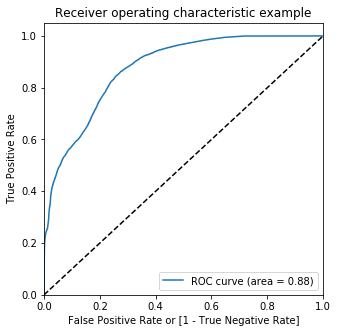

(array([0.00000000e+00, 5.02426721e-06, 1.00485344e-05, ...,
        9.99989951e-01, 9.99994976e-01, 1.00000000e+00]),
 array([0., 0., 0., ..., 1., 1., 1.]),
 array([2.00000000e+00, 1.00000000e+00, 9.99999965e-01, ...,
        1.89865934e-05, 9.27405853e-06, 7.95685208e-06]))

In [155]:
draw_roc(y_train_pred_final.Fraud, y_train_pred_final.Fraud_Prob)

### The area under the curve

In [156]:
def auc_val(fpr,tpr):
    AreaUnderCurve = 0.
    for i in range(len(fpr)-1):
        AreaUnderCurve += (fpr[i+1]-fpr[i]) * (tpr[i+1]+tpr[i])
    AreaUnderCurve *= 0.5
    return AreaUnderCurve

In [157]:
auc = auc_val(fpr,tpr)
auc

0.8769416705801876

## Finding the Probablity Cutoff Point

In [158]:
# create columns with different probability cutoffs 
num = [float(x)/10 for x in range(10)]
for i in num:
    y_train_pred_final[i]= y_train_pred_final.Fraud_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
239371,0,0.123421,0,1,1,0,0,0,0,0,0,0,0
267770,0,0.048666,0,1,0,0,0,0,0,0,0,0,0
498983,1,0.576021,1,1,1,1,1,1,1,0,0,0,0
306770,1,0.558126,1,1,1,1,1,1,1,0,0,0,0
227598,0,0.495748,1,1,1,1,1,1,0,0,0,0,0


In [159]:
#calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.499662  1.000000  0.000000
0.1   0.1  0.648725  0.998365  0.299557
0.2   0.2  0.734394  0.968304  0.500799
0.3   0.3  0.779637  0.925968  0.633505
0.4   0.4  0.792327  0.869373  0.715385
0.5   0.5  0.781457  0.779347  0.783565
0.6   0.6  0.753813  0.670943  0.836571
0.7   0.7  0.737206  0.573079  0.901112
0.8   0.8  0.713421  0.472538  0.953978
0.9   0.9  0.631007  0.276055  0.985480


### Plot of the accuracy, sensitivity and specificity for various probabilities

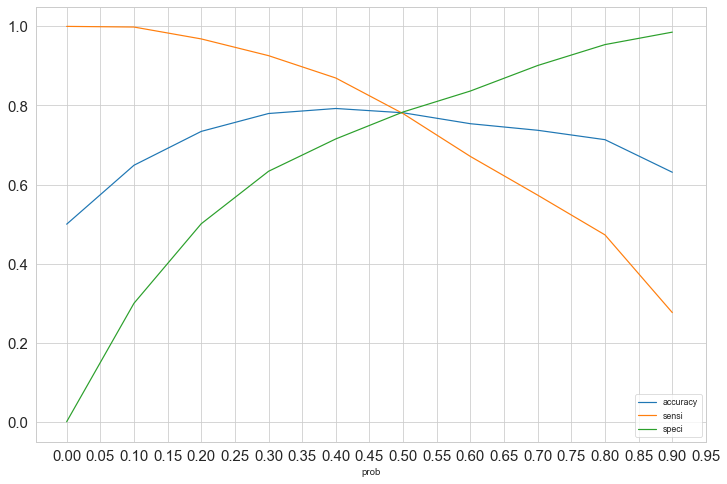

In [160]:
sns.set_style("whitegrid") 
sns.set_context("paper") 
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'], figsize=(12,8))
#plt.xticks(np.arange(0, 1, step=0.05), size = 15)
plt.xticks(np.arange(0, 1, step=0.05), size = 15)                    
plt.yticks(size = 15)
plt.show()

### 0.495 is the optimum point to take it as a cutoff probability

In [161]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Fraud_Prob.map( lambda x: 1 if x > 0.495 else 0)

y_train_pred_final.head()

,Fraud,Fraud_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
239371,0,0.123421,0,1,1,0,0,0,0,0,0,0,0,0
267770,0,0.048666,0,1,0,0,0,0,0,0,0,0,0,0
498983,1,0.576021,1,1,1,1,1,1,1,0,0,0,0,1
306770,1,0.558126,1,1,1,1,1,1,1,0,0,0,0,1
227598,0,0.495748,1,1,1,1,1,1,0,0,0,0,0,1


In [162]:
metrics.accuracy_score(y_train_pred_final.Fraud, y_train_pred_final.final_predicted)

0.782201564106496

In [164]:
confusion1 = metrics.confusion_matrix(y_train_pred_final.Fraud, y_train_pred_final.final_predicted)
confusion1

array([[155337,  43697],
       [ 42943, 155822]], dtype=int64)

In [165]:
TP = confusion1[1,1] # true positive 
TN = confusion1[0,0] # true negatives
FP = confusion1[0,1] # false positives
FN = confusion1[1,0] # false negatives

In [166]:
#sensitivity 
TP / float(TP+FN)

0.7839508967876638

In [167]:
#specificity
TN / float(TN+FP)

0.7804545956972175

In [168]:
#false postive rate
print(FP/ float(TN+FP))

0.21954540430278244


In [169]:
# Positive predictive value 
print (TP / float(TP+FP))

0.7809882768057177


In [170]:
# Negative predictive value
print (TN / float(TN+ FN))

0.783422432923139


# Precision and Recall

In [171]:
precision = confusion1[1,1]/(confusion1[0,1]+confusion1[1,1])
precision

0.7809882768057177

In [172]:
recall = confusion1[1,1]/(confusion1[1,0]+confusion1[1,1])
recall

0.7839508967876638

In [174]:
precision_score(y_train_pred_final.Fraud, y_train_pred_final.final_predicted)

0.7809882768057177

In [175]:
recall_score(y_train_pred_final.Fraud, y_train_pred_final.final_predicted)

0.7839508967876638

In [176]:
y_train_pred_final.Fraud, y_train_pred_final.final_predicted

(239371    0
 267770    0
 498983    1
 306770    1
 227598    0
 65574     0
 330477    1
 498844    1
 229267    0
 99858     0
 262410    0
 247477    0
 13135     0
 545750    1
 210524    0
 93074     0
 522791    1
 500419    1
 567556    1
 206903    0
 145501    0
 403574    1
 111809    0
 82702     0
 415522    1
 471748    1
 557252    1
 108955    0
 114658    0
 381134    1
 465871    1
 246804    0
 274280    0
 194457    0
 308321    1
 528369    1
 355836    1
 542328    1
 56907     0
 239253    0
 493031    1
 508892    1
 197249    0
 185076    0
 282083    0
 64649     0
 422097    1
 349980    1
 72383     0
 150576    0
 221047    0
 526615    1
 9740      0
 219608    0
 246872    0
 399985    1
 391971    1
 466206    1
 422621    1
 304677    1
 331750    1
 486686    1
 507222    1
 47940     0
 338354    1
 36181     0
 321660    1
 3639      0
 526022    1
 30973     0
 416172    1
 203732    0
 23145     0
 483215    1
 451683    1
 190295    0
 190520    0

In [177]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Fraud, y_train_pred_final.Fraud_Prob)

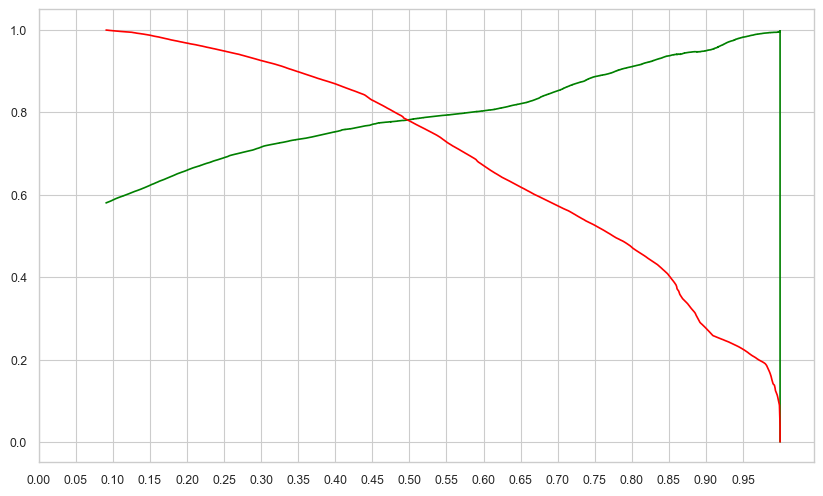

In [178]:
plt.figure(figsize=(10, 6), dpi=100, facecolor='w', edgecolor='k', frameon='True')
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.xticks(np.arange(0, 1, step=0.05))
plt.show()